In [32]:
import numpy as np

import matplotlib.pyplot as plt
import mplhep as hep

plt.style.use(hep.cms.style.ROOT)
plt.rcParams['axes.axisbelow'] = True

In [33]:
model_name = 'fgsm'#'nominal'
attacks = ['nominal','FGSM','FGSM_flavour_012008010','FGSM_domain_random']
#'FGSM_flavour_default','FGSM_domain_default',
names = np.load('/eos/user/h/heschone/DeepJet/Train_DF_Run2/{}/variables/names.npy'.format(model_name),allow_pickle=True)
variables = np.load('/eos/user/h/heschone/DeepJet/Train_DF_Run2/{}/variables/variables.npy'.format(model_name),allow_pickle=True)
variables_fgsm = np.load('/eos/user/h/heschone/DeepJet/Train_DF_Run2/{}/variables/variables_fgsm.npy'.format(model_name),allow_pickle=True)
variables_fgsm_flavour_default = np.load('/eos/user/h/heschone/DeepJet/Train_DF_Run2/{}/variables/variables_fgsm_flavour_default.npy'.format(model_name),allow_pickle=True)
variables_fgsm_flavour_012008010 = np.load('/eos/user/h/heschone/DeepJet/Train_DF_Run2/{}/variables/variables_fgsm_flavour_012008010.npy'.format(model_name),allow_pickle=True)
variables_fgsm_domain_default = np.load('/eos/user/h/heschone/DeepJet/Train_DF_Run2/{}/variables/variables_fgsm_domain_default.npy'.format(model_name),allow_pickle=True)
variables_fgsm_domain_random = np.load('/eos/user/h/heschone/DeepJet/Train_DF_Run2/{}/variables/variables_fgsm_domain_random.npy'.format(model_name),allow_pickle=True)

In [34]:
attack_labels = {
    'nominal': 'nominal',
    'FGSM': r'FGSM $\epsilon=0.01$',
    'FGSM_flavour_default': r'FGSM $\epsilon=(0.01,0.01,0.01)$',
    'FGSM_flavour_012008010': r'FGSM $\epsilon=(0.012,0.008,0.01)$',
    'FGSM_domain_default': r'FGSM $\hat{\epsilon}=0.01$',
    'FGSM_domain_random': r'FGSM $\hat{\epsilon}=$random initialization ~ U(0,0.02)',
}
attack_arrays = {
    'nominal': variables,
    'FGSM': variables_fgsm,
    'FGSM_flavour_default': variables_fgsm_flavour_default,
    'FGSM_flavour_012008010': variables_fgsm_flavour_012008010,
    'FGSM_domain_default': variables_fgsm_domain_default,
    'FGSM_domain_random': variables_fgsm_domain_random,
}
attack_colors = {
    'nominal': 'tab:blue',
    'FGSM': 'tab:orange',
    'FGSM_flavour_default': 'tab:red',
    'FGSM_flavour_012008010': 'tab:red',
    'FGSM_domain_default': 'tab:purple',
    'FGSM_domain_random': 'tab:purple',
}

quantity_indices = {
    'jet_pt': 0,
    'jet_eta': 0, 
    'nCpfcand': 0, 
    'nNpfcand': 0, 
    'sv_pt': 0, 
    'sv_deltaR': 0,
    'sv_mass': 0, 
    'sv_dxy': 0, 
    'sv_dxysig': 0, 
    'sv_d3d': 0, 
    'sv_d3dsig': 0, 
    'isB': 0,
    'isBB': 0, 
    'isLeptonicB': 0, 
    'isC': 0, 
    'isUDS': 0, 
    'isG': 0, 
    'prob_isB': 0,
    'prob_isBB': 0, 
    'prob_isLeptonicB': 0, 
    'prob_isC': 0, 
    'prob_isUDS': 0,
    'prob_isG': 0,
}
for i in range(len(names)):
    quantity_indices[names[i]] = i
    
quantity_labels = {
    'jet_pt': '$p_{T,jet}[GeV]$',
    'jet_eta': '$\eta_{jet}$', 
    'nCpfcand': 'N_{CPF}', 
    'nNpfcand': 'N_{NPF}', 
    'sv_pt': '$p_{T,SV}[GeV]$', 
    'sv_deltaR': '$\Delta R(PV,SV)$',
    'sv_mass': '$m_{SV}[GeV]$', 
    'sv_dxy': '2D IP[mm]', 
    'sv_dxysig': '2D IP significance[mm]', 
    'sv_d3d': '3D IP[mm]', 
    'sv_d3dsig': '3D IP significance[mm]', 
    'isB': 0,
    'isBB': 0, 
    'isLeptonicB': 0, 
    'isC': 0, 
    'isUDS': 0, 
    'isG': 0, 
    'prob_isB': 'P(b)',
    'prob_isBB': 'P(bb)', 
    'prob_isLeptonicB': 'P(lep b)', 
    'prob_isC': 'P(c)', 
    'prob_isUDS': 'P(uds)',
    'prob_isG': 'P(g)',
}

In [35]:
def softmax(array):
    N = len(array[:,0])
    d = len(array[0,:])
    softmax_output = np.zeros((N,d))
    for i in range(N):
        for j in range(d):
            if np.max(array[i,:])<100:
                softmax_output[i,j] = np.exp(array[i,j])/np.sum(np.exp(array[i,:]))
            else:
                if j==np.argmax(array[i,:]):
                    softmax_output[i,j] = 1
    return softmax_output

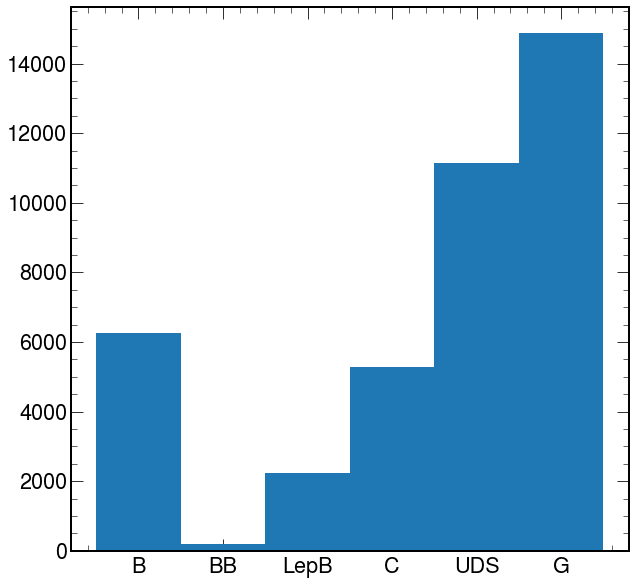

In [36]:
# create array with truth flavours
flavour_ids = [1,2,3,4,5,6]
flavour = variables[quantity_indices['isB'],:]*flavour_ids[0] + variables[quantity_indices['isBB'],:]*flavour_ids[1] \
+ variables[quantity_indices['isLeptonicB'],:]*flavour_ids[2] + variables[quantity_indices['isC'],:]*flavour_ids[3] \
+ variables[quantity_indices['isUDS'],:]*flavour_ids[4] + variables[quantity_indices['isG'],:]*flavour_ids[5]

# plot histogram of true flavours
plt.figure()
flavour_N, dummy, dummy = plt.hist(flavour, range=(0.5,6.5), bins=6)
plt.xticks(ticks=[1,2,3,4,5,6],labels=['B','BB','LepB','C','UDS','G'])
plt.show()

# flavour settings
flavour_names = ['b','bb','lepB','c','uds','g']
flavour_colors = ['tab:purple', 'tab:blue', 'tab:green', 'tab:olive', 'tab:orange', 'tab:red']

In [37]:
output = np.zeros((len(variables[quantity_indices['prob_isB'],:]),6))
quantities = ['prob_isB', 'prob_isBB', 'prob_isLeptonicB', 'prob_isC', 'prob_isUDS', 'prob_isG']
for i in range(len(quantities)):
    output[:,i] = variables[quantity_indices[quantities[i]],:]
softmax_output = softmax(output)

saving
saving
saving
saving
saving
saving


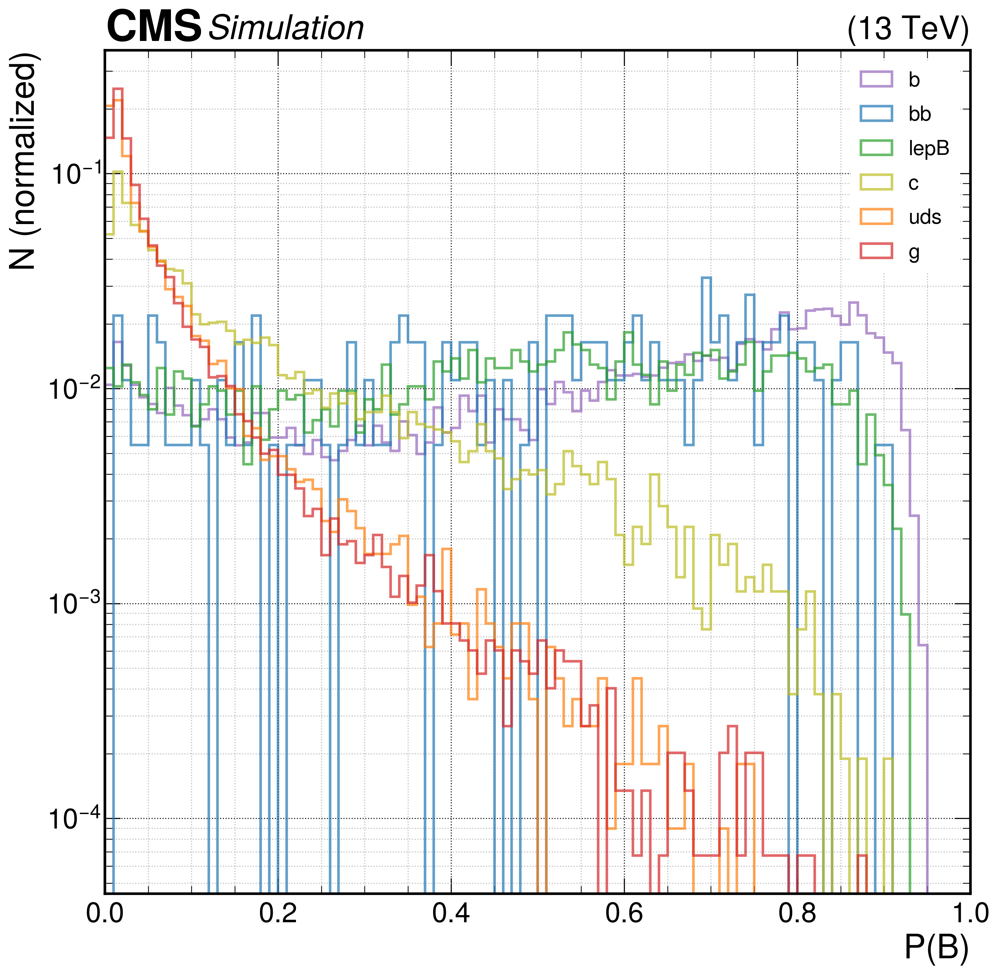

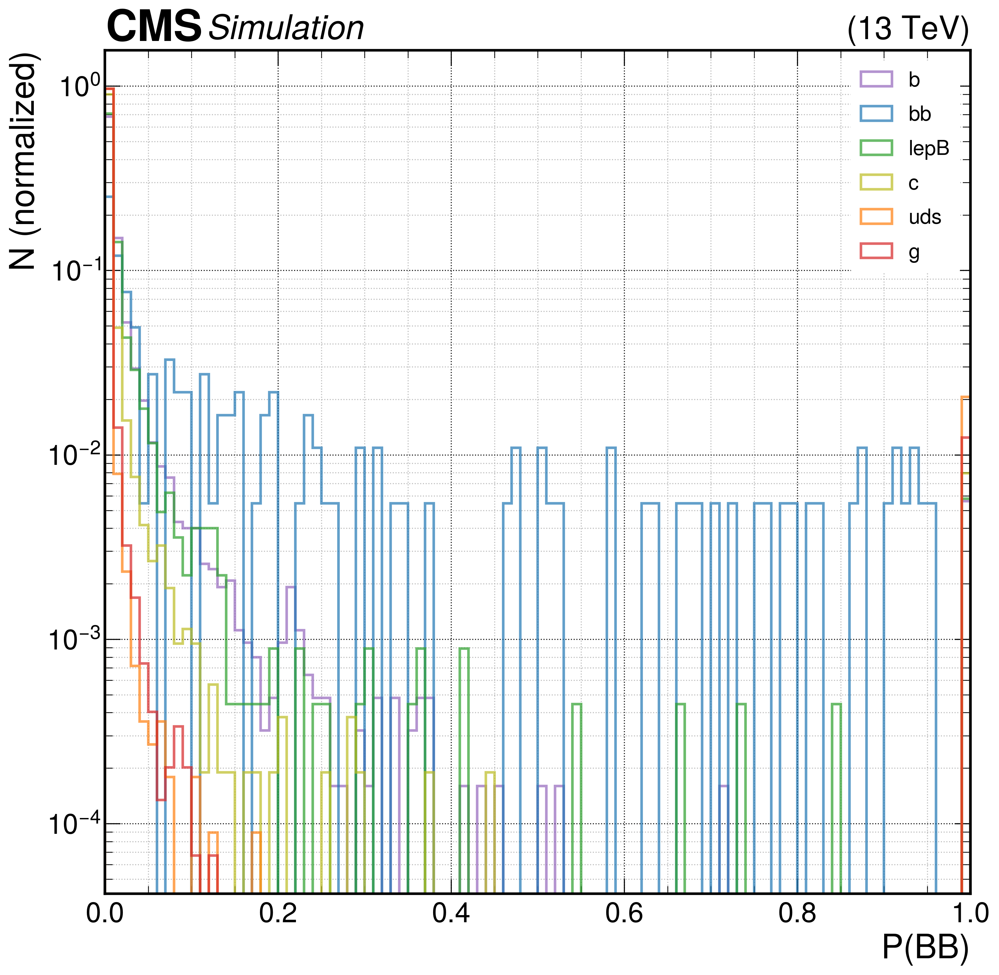

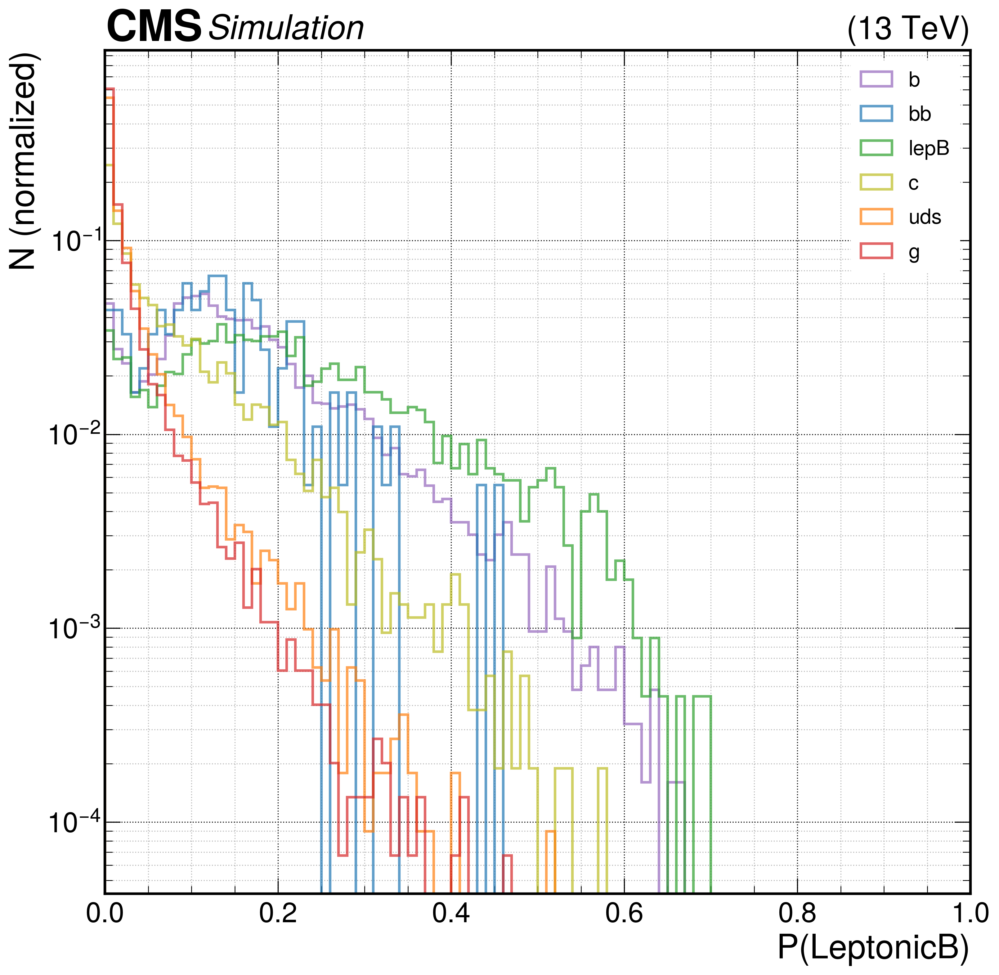

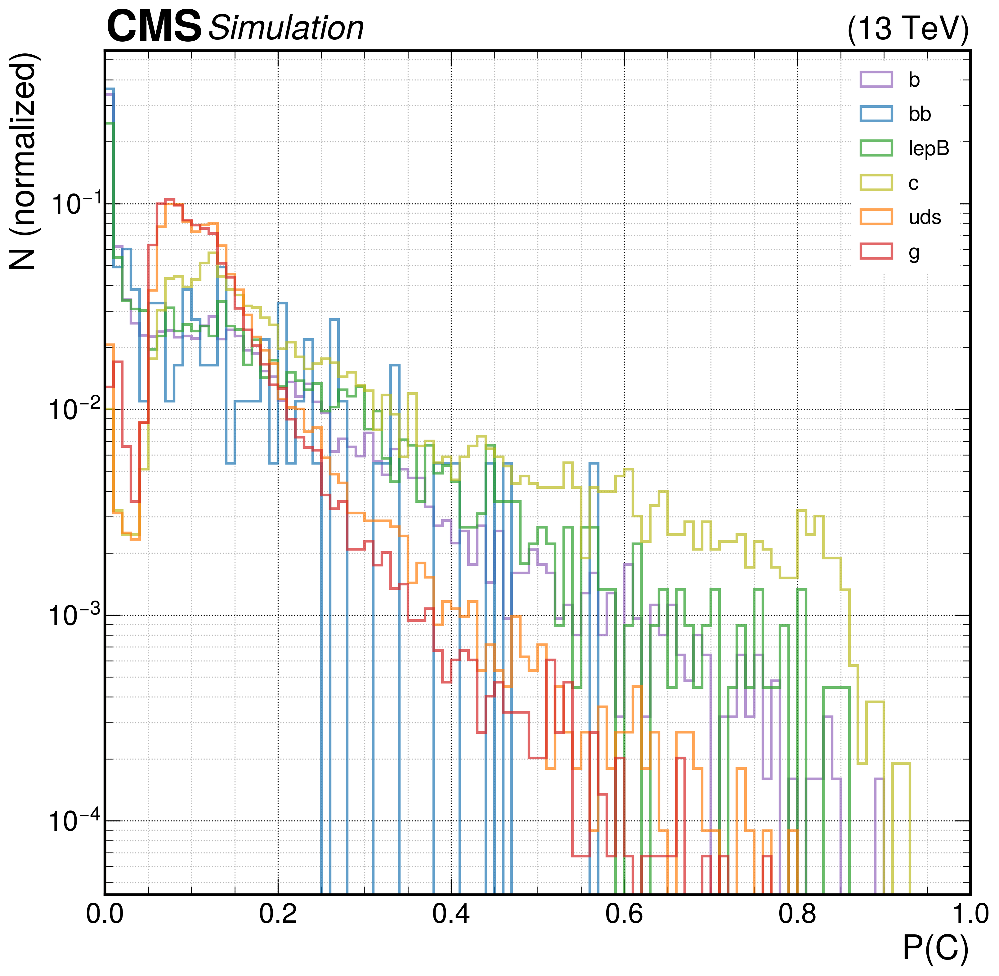

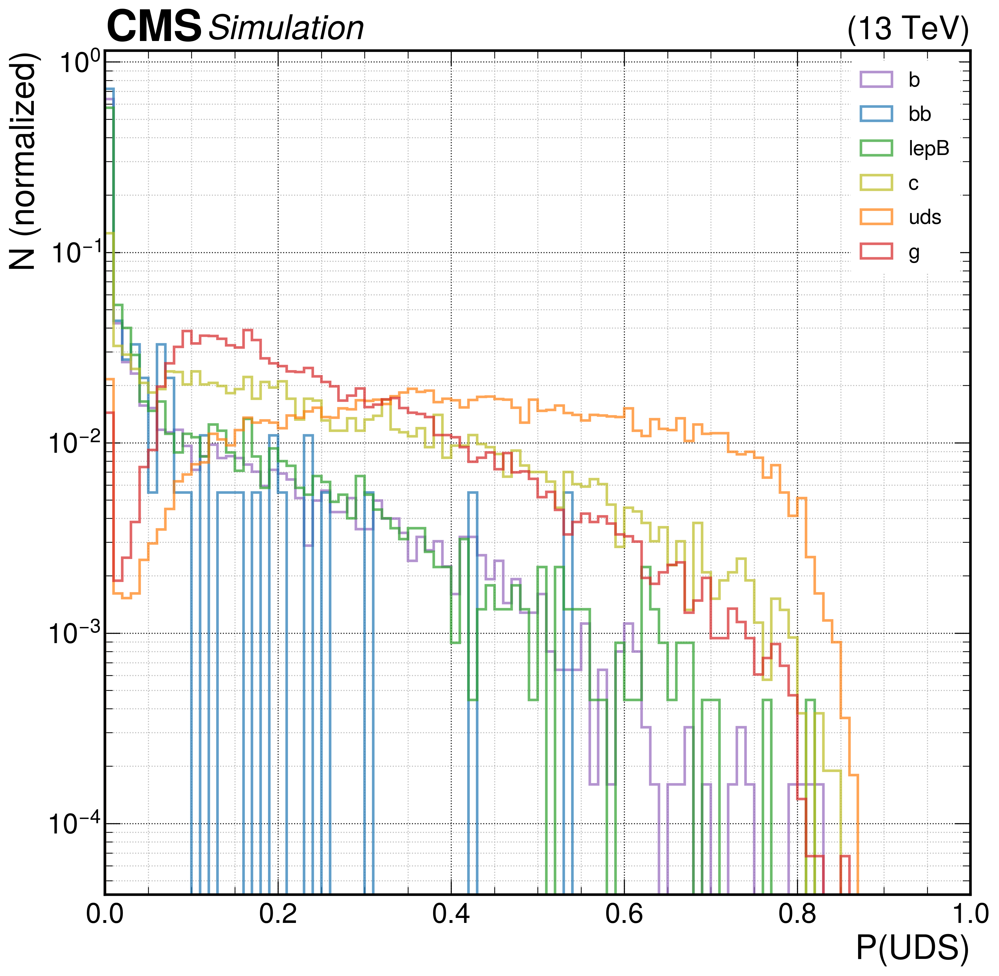

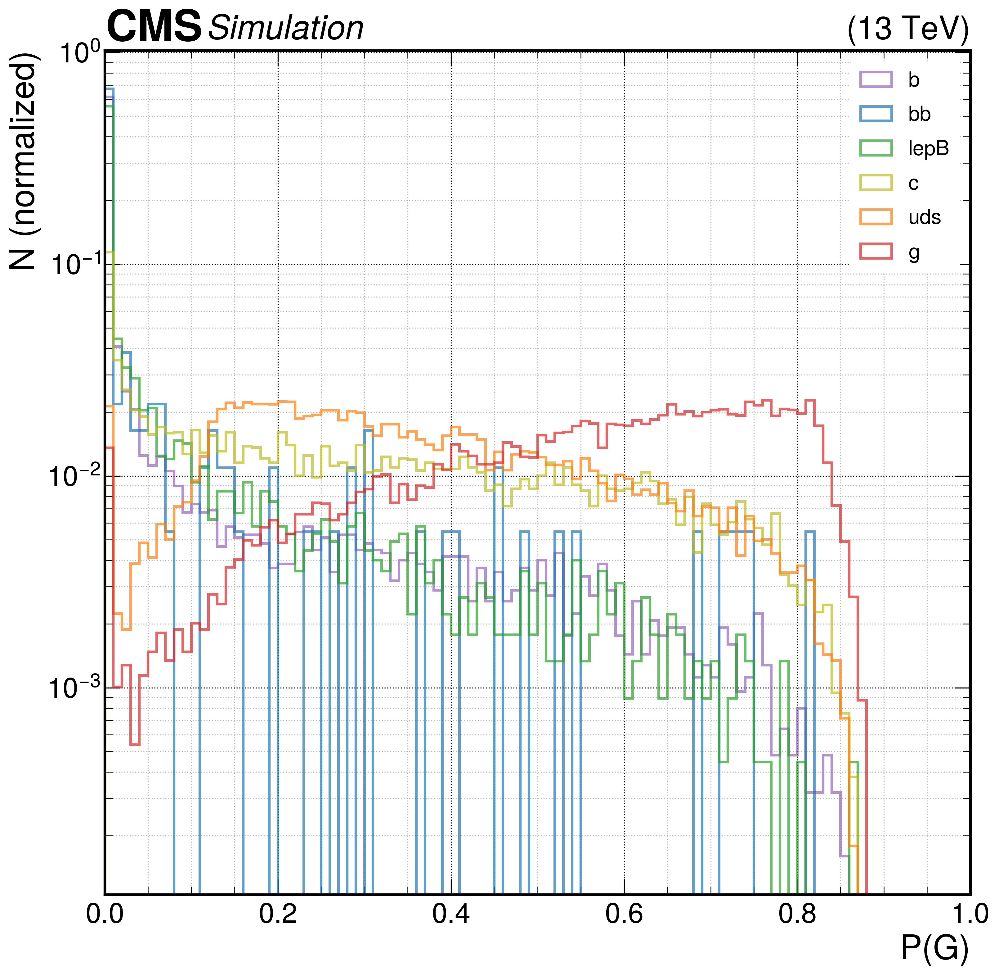

In [38]:
# plot model outputs
# 1 output, 6 flavours
output_labels = ['P(B)', 'P(BB)', 'P(LeptonicB)', 'P(C)', 'P(UDS)', 'P(G)']
output_names = ['p_B', 'p_BB', 'p_LeptonicB', 'p_C', 'p_UDS', 'p_G']

for i in range(len(output_labels)):
    fig,ax = plt.subplots(figsize=[12,12], dpi=300)
    ax.set_xlim(left=0, right=1)
    ax.set_yscale('log')
    ax.set_ylabel('N (normalized)')
    ax.set_xlabel(output_labels[i])
    ax.grid(which='minor', alpha=0.85)
    ax.grid(which='major', alpha=0.95, color='black')
    for j in range(len(flavour_names)):
        x = softmax_output[np.where(flavour==flavour_ids[j])[0],i]
        ax.hist(x, bins=100, range=(0,1), weights=np.ones(len(x))/flavour_N[j], histtype='step', linewidth=2,
        alpha=0.7, color=flavour_colors[j], label=flavour_names[j])
    legloc = 'upper right'
    leg=ax.legend(title='',fontsize=16,title_fontsize=20,labelspacing=0.7,loc=legloc,frameon=True,framealpha=1,facecolor='white')
    if 'right' in legloc:
        aligned = 'right'
    else:
        aligned = 'left'
    leg._legend_box.align = aligned
    leg.get_frame().set_linewidth(0.0)
    hep.cms.label(rlabel='(13 TeV)')
    print('saving')
    fig.savefig('output_plots/{}_{}.pdf'.format(model_name, output_names[i]))

saving
saving
saving
saving
saving
saving


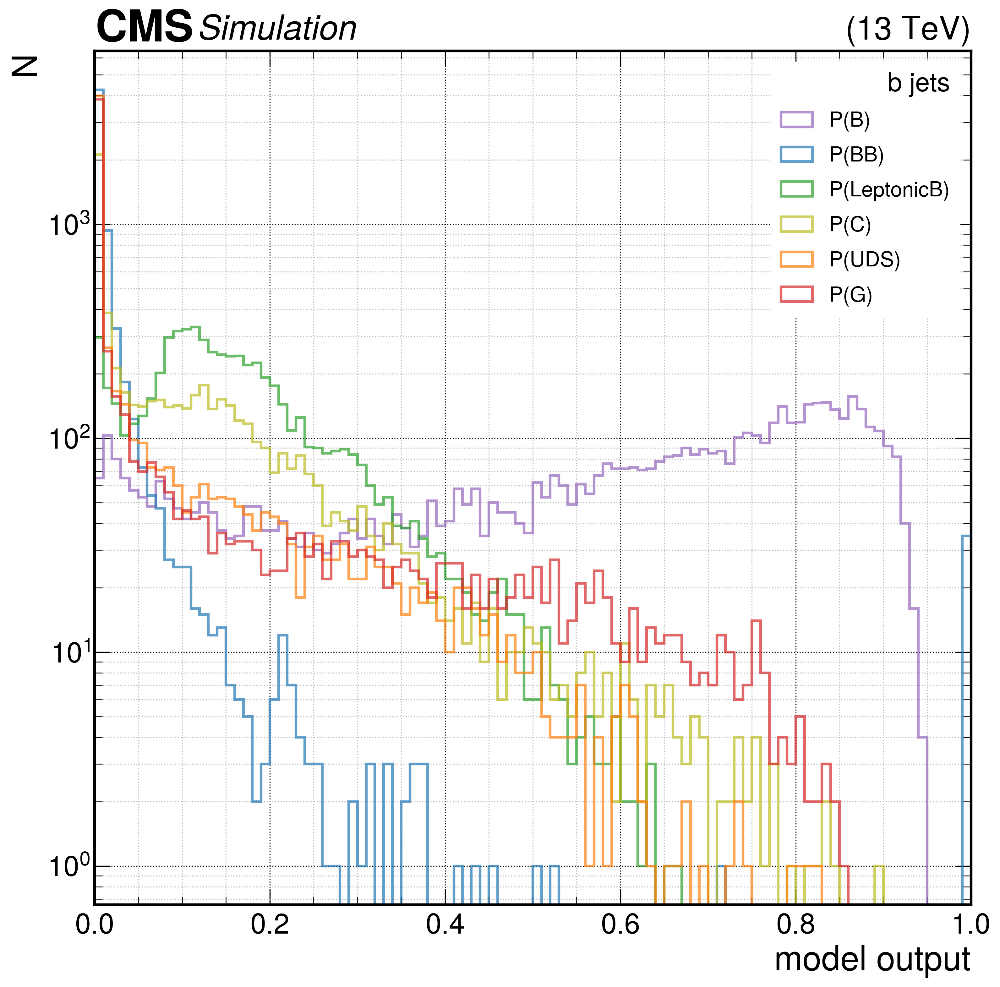

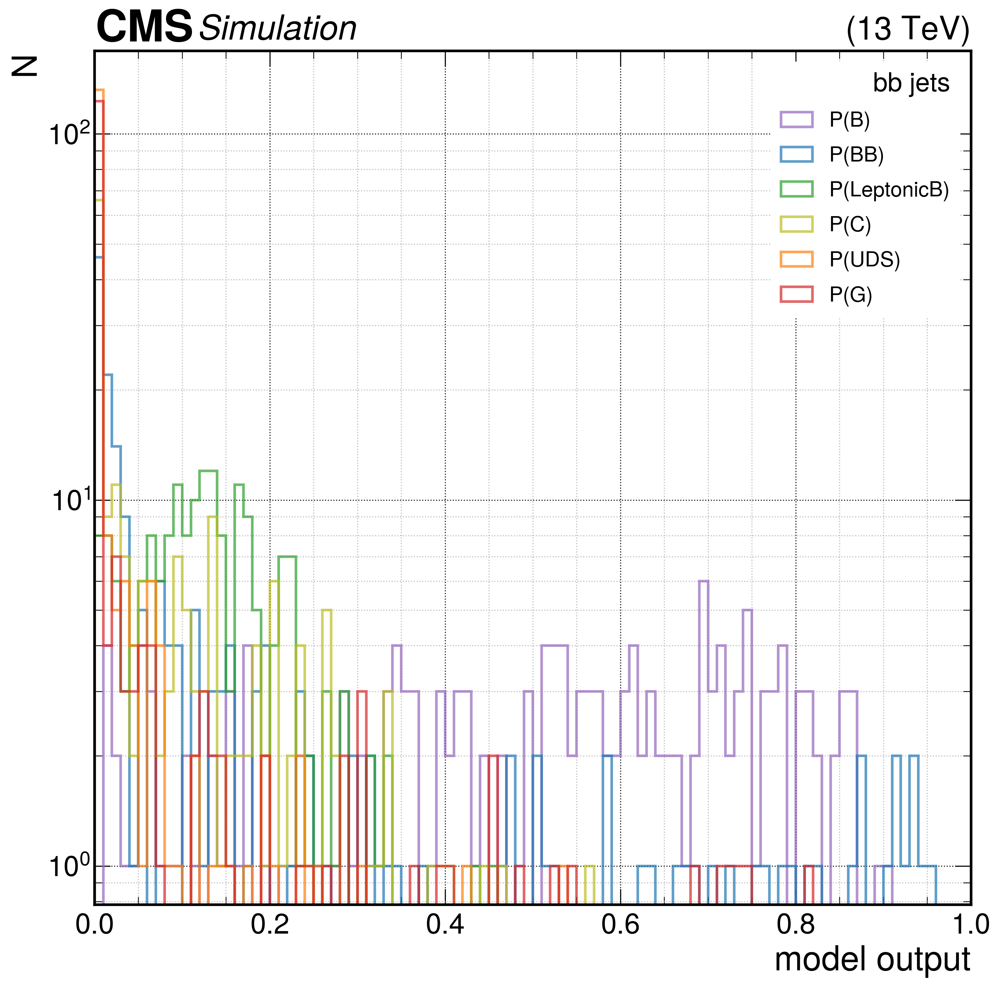

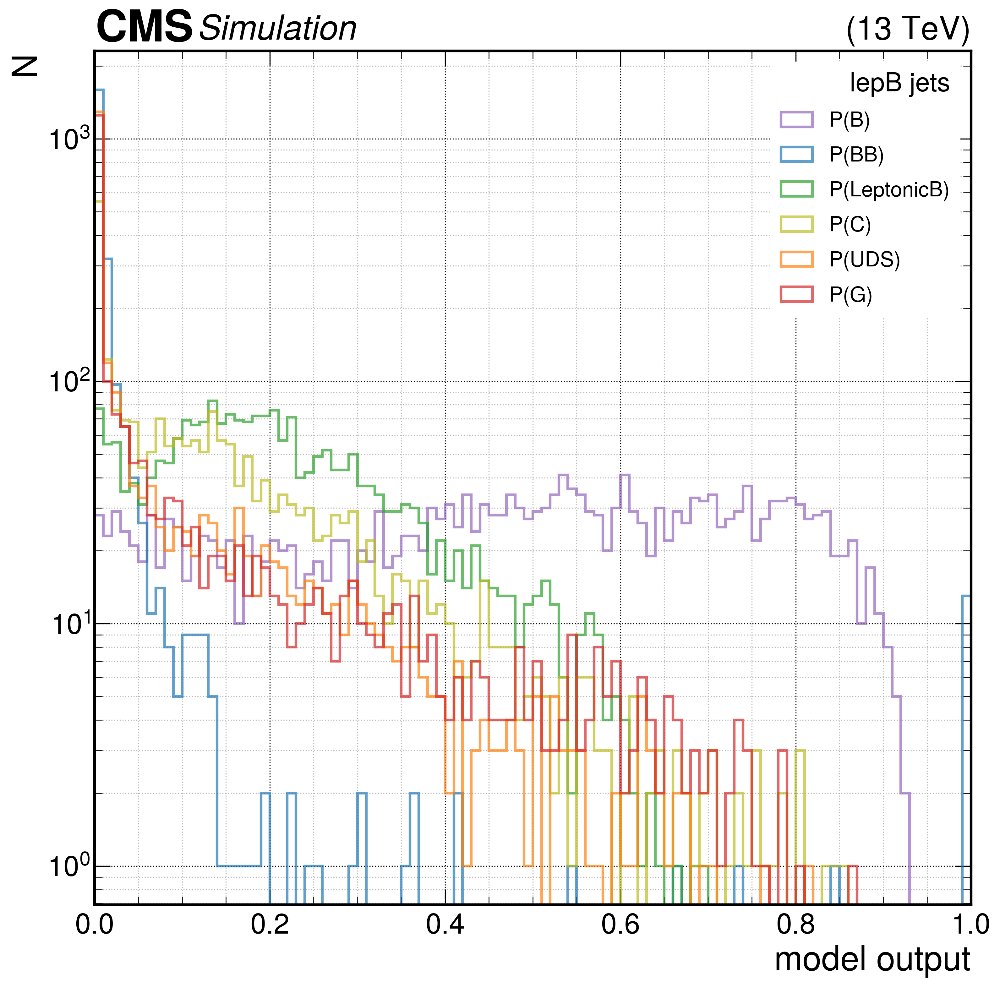

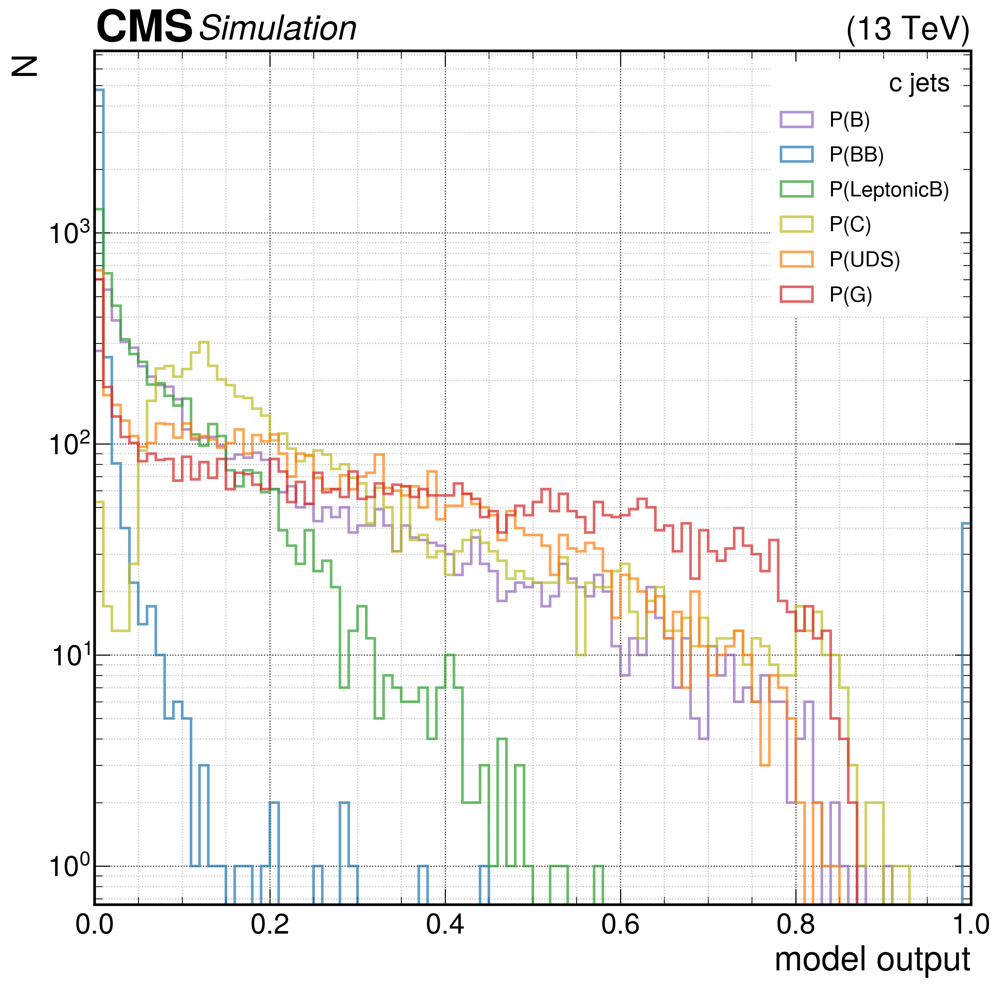

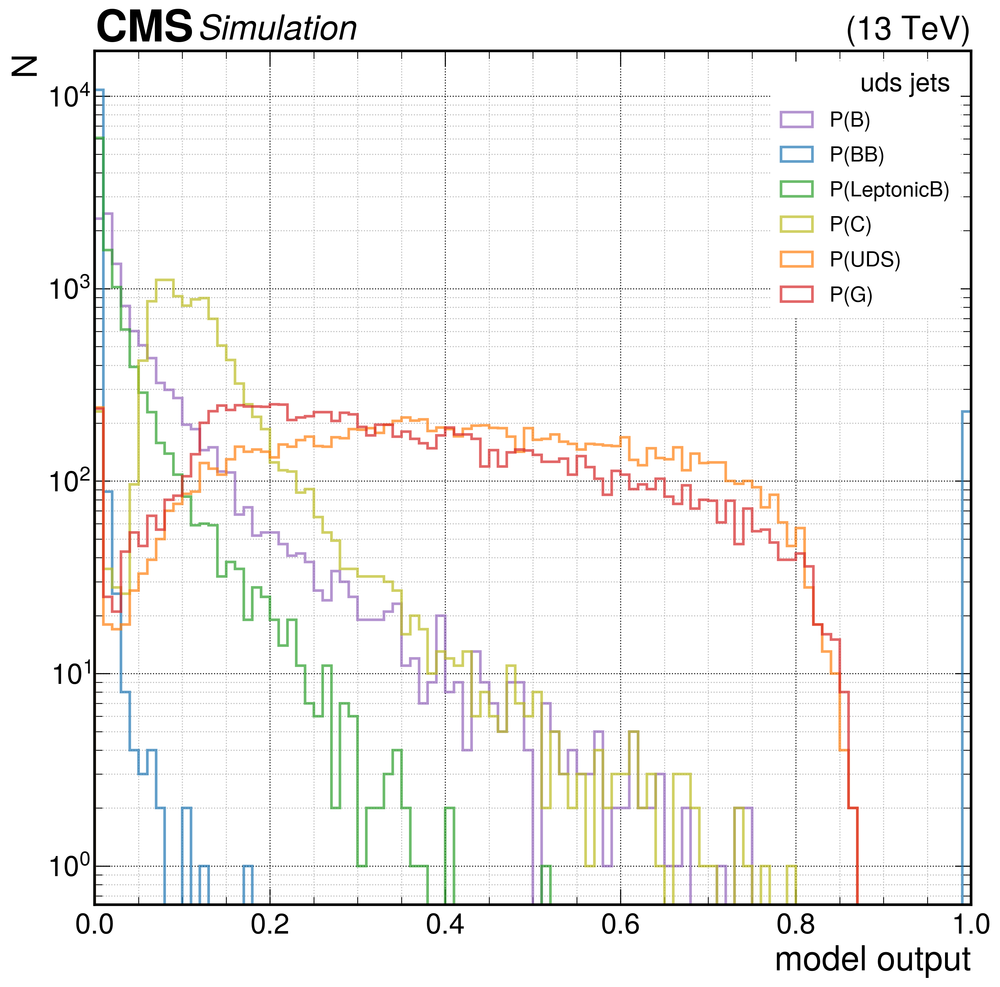

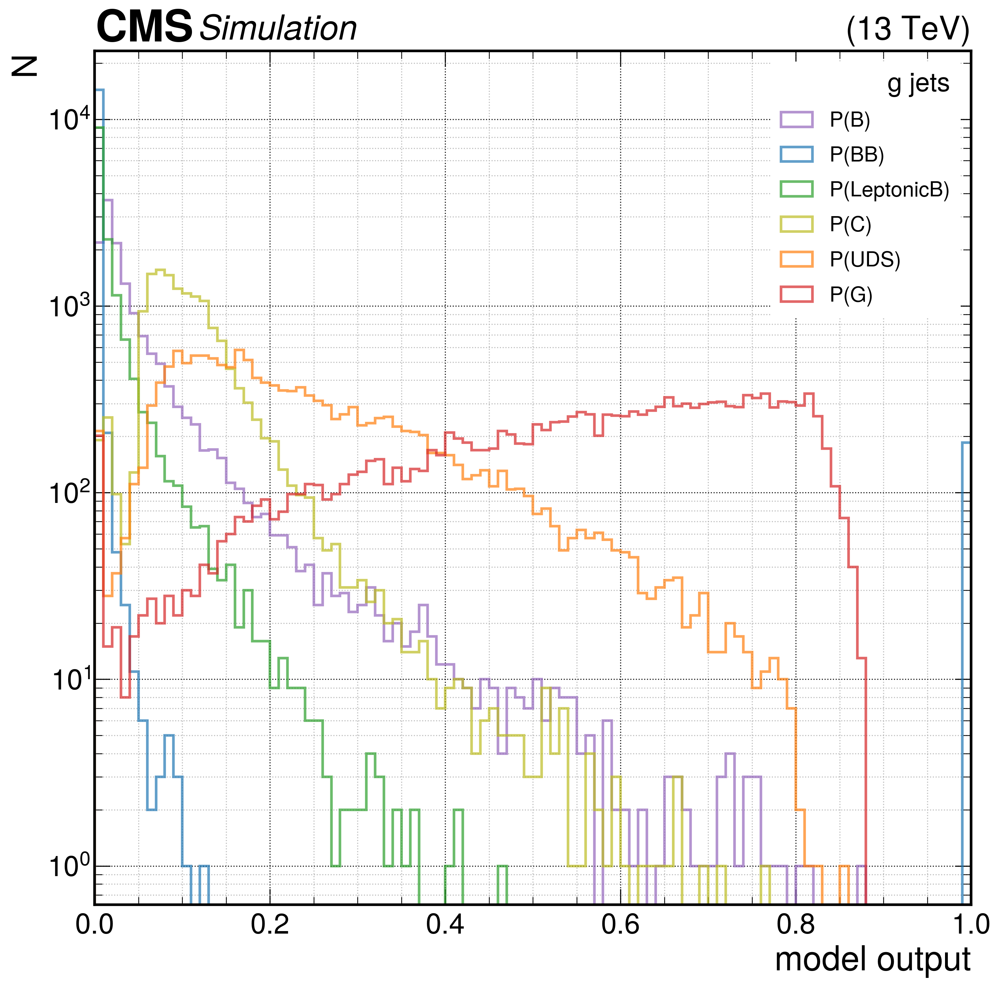

In [39]:
# plot model outputs for each flavour
# 6 outputs, 1 flavour
output_labels = ['P(B)', 'P(BB)', 'P(LeptonicB)', 'P(C)', 'P(UDS)', 'P(G)']
output_names = ['p_B', 'p_BB', 'p_LeptonicB', 'p_C', 'p_UDS', 'p_G']
output_colors = ['tab:purple', 'tab:blue', 'tab:green', 'tab:olive', 'tab:orange', 'tab:red']

for i in range(len(flavour_names)):
    fig,ax = plt.subplots(figsize=[12,12], dpi=300)
    ax.set_xlim(left=0, right=1)
    ax.set_yscale('log')
    ax.set_ylabel('N')
    ax.set_xlabel('model output')
    ax.grid(which='minor', alpha=0.85)
    ax.grid(which='major', alpha=0.95, color='black')
    for j in range(len(output_labels)):
        x = softmax_output[np.where(flavour==flavour_ids[i])[0],j]
        ax.hist(x, bins=100, range=(0,1), weights=None, histtype='step', linewidth=2,
        alpha=0.7, color=output_colors[j], label=output_labels[j])
    legloc = 'upper right'
    leg=ax.legend(title='{} jets'.format(flavour_names[i]),fontsize=16,title_fontsize=20,labelspacing=0.7,loc=legloc,frameon=True,framealpha=1,facecolor='white')
    if 'right' in legloc:
        aligned = 'right'
    else:
        aligned = 'left'
    leg._legend_box.align = aligned
    leg.get_frame().set_linewidth(0.0)
    hep.cms.label(rlabel='(13 TeV)')
    print('saving')
    fig.savefig('output_plots/{}_{}_outputs.pdf'.format(model_name, flavour_names[i]))

<ipython-input-40-f4e42b2743a7>:7: RuntimeWarning: invalid value encountered in divide
  CvL = np.where(C+L>0, C/(C+L), -1)


saving
saving
saving


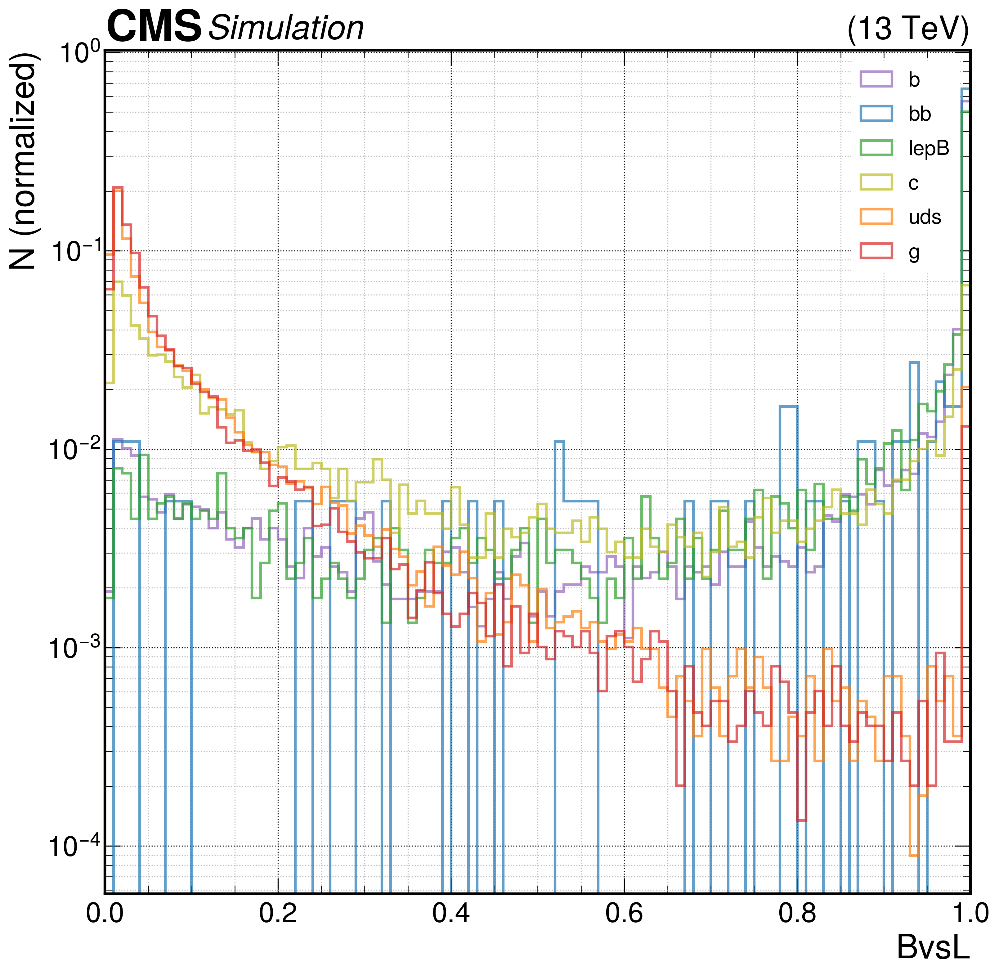

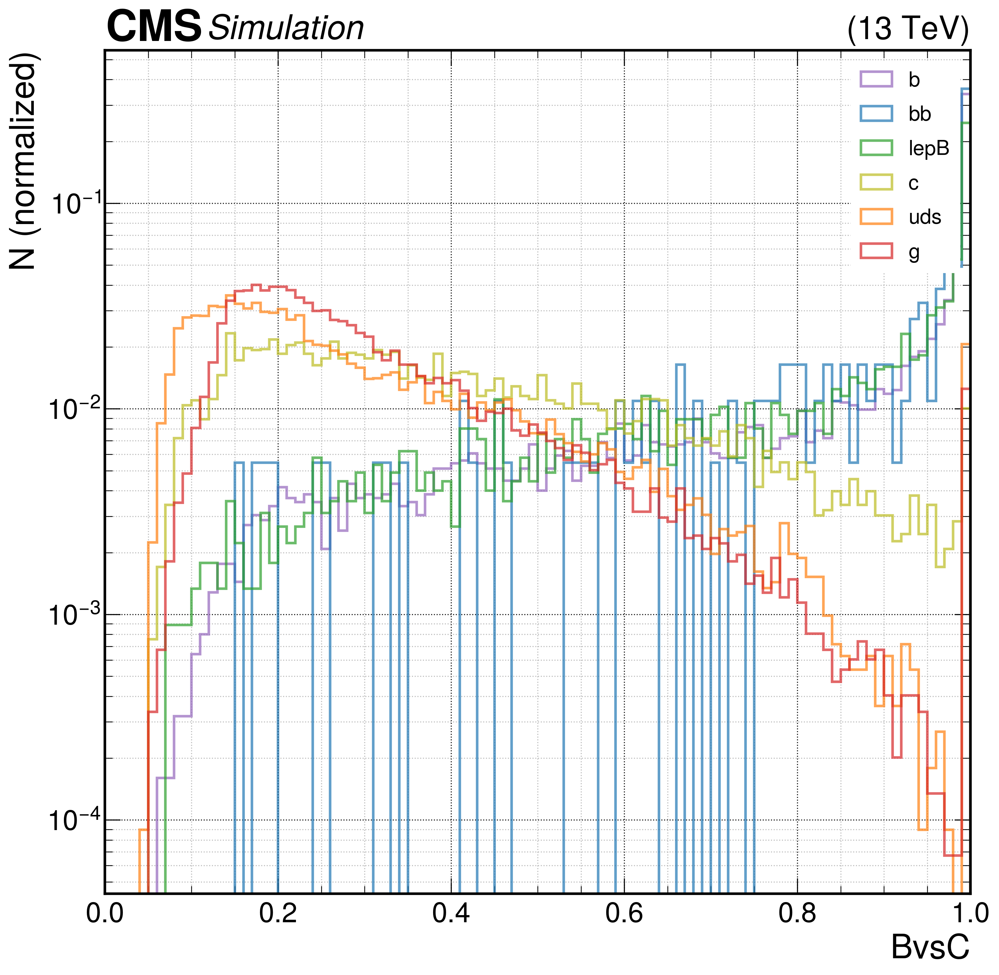

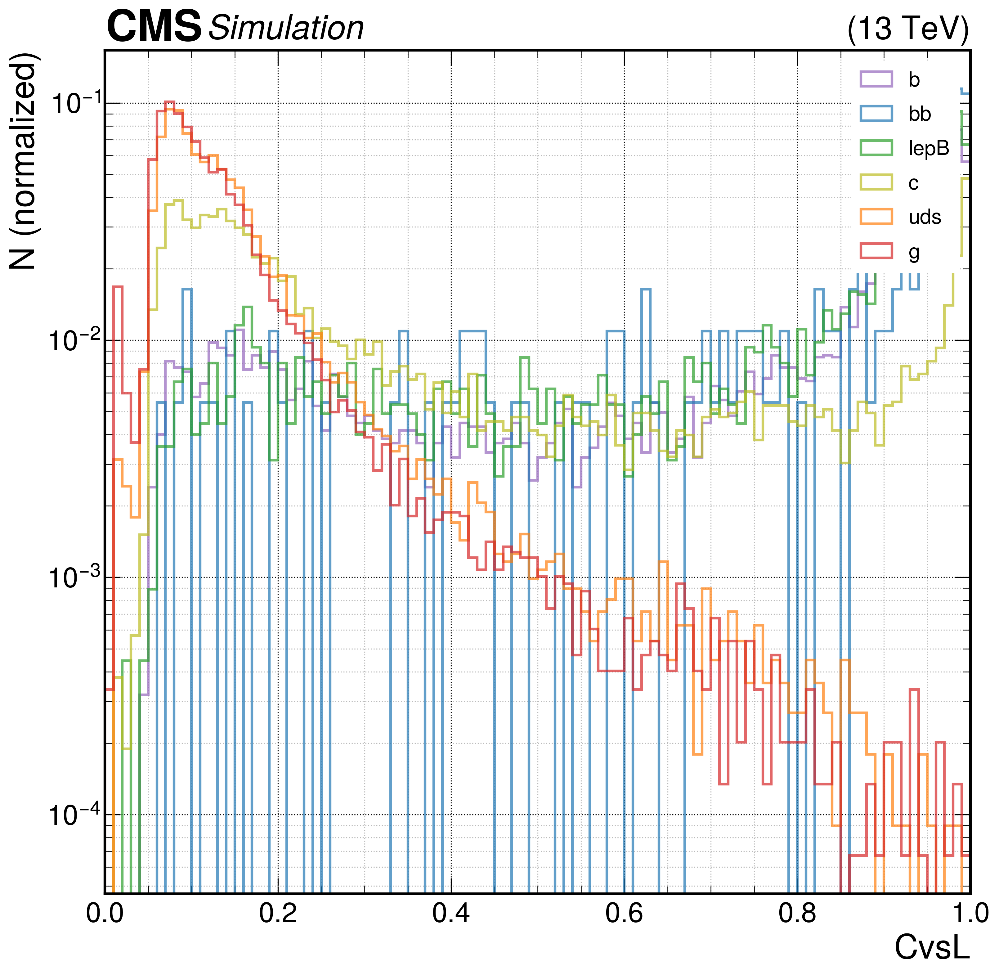

In [40]:
# plot discriminators
B = softmax_output[:,0] + softmax_output[:,1] + softmax_output[:,2]
C = softmax_output[:,3]
L = softmax_output[:,4] + softmax_output[:,5]
BvL = np.where(B+L>0, B/(B+L), -1)
BvC = np.where(B+C>0, B/(B+C), -1)
CvL = np.where(C+L>0, C/(C+L), -1)
discriminators = [BvL,BvC,CvL]
discriminator_labels = ['BvsL', 'BvsC', 'CvsL']

for i in range(len(discriminators)):
    fig,ax = plt.subplots(figsize=[12,12], dpi=300)
    ax.set_xlim(left=0, right=1)
    ax.set_yscale('log')
    ax.set_ylabel('N (normalized)')
    ax.set_xlabel(discriminator_labels[i])
    ax.grid(which='minor', alpha=0.85)
    ax.grid(which='major', alpha=0.95, color='black')
    for j in range(len(flavour_names)):
        x = discriminators[i][np.where(flavour==flavour_ids[j])[0]]
        ax.hist(x, bins=100, range=(0,1), weights=np.ones(len(x))/flavour_N[j], histtype='step', linewidth=2,
        alpha=0.7, color=flavour_colors[j], label=flavour_names[j])
    legloc = 'upper right'
    leg=ax.legend(title='',fontsize=16,title_fontsize=20,labelspacing=0.7,loc=legloc,frameon=True,framealpha=1,facecolor='white')
    if 'right' in legloc:
        aligned = 'right'
    else:
        aligned = 'left'
    leg._legend_box.align = aligned
    leg.get_frame().set_linewidth(0.0)
    hep.cms.label(rlabel='(13 TeV)')
    print('saving')
    fig.savefig('output_plots/{}_{}.pdf'.format(model_name, discriminator_labels[i]))

[-10, 200]
saving
[-20, 460]
saving
[-10, 100]
saving
[-210, 10]
saving
[-220, 10]
saving
[-280, 10]
saving


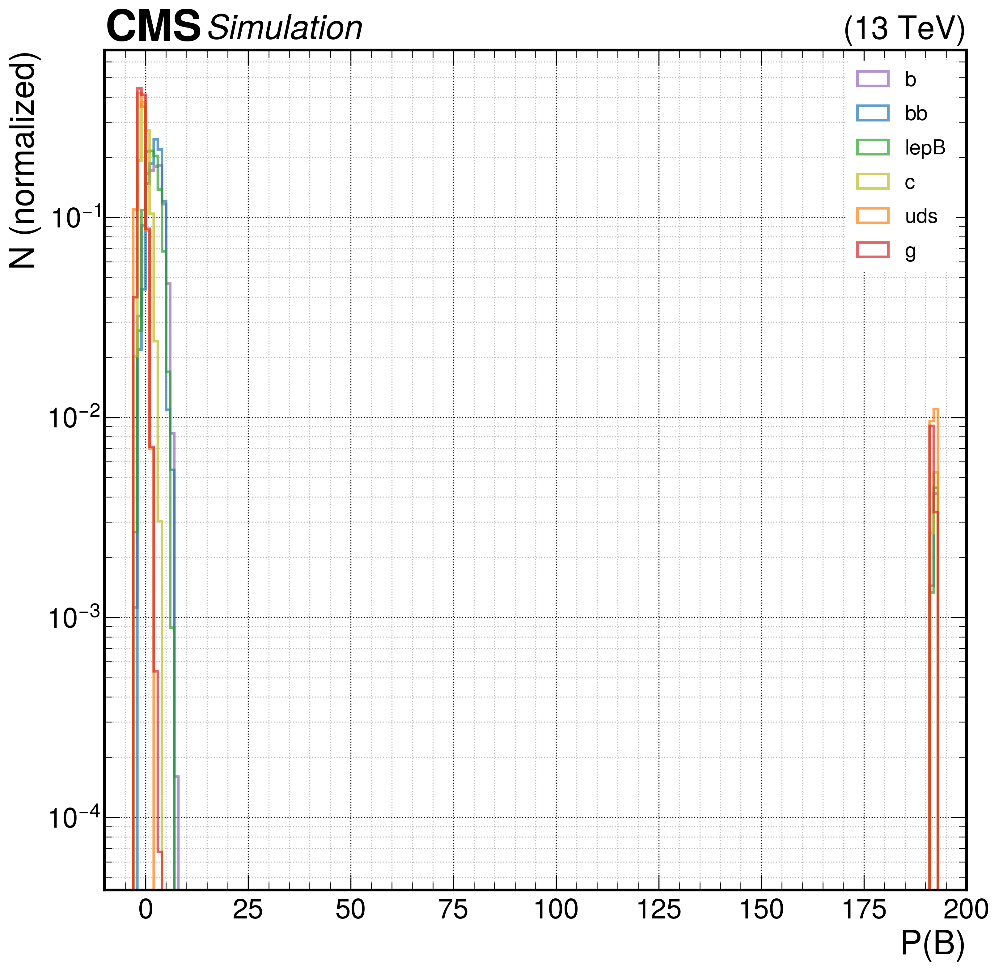

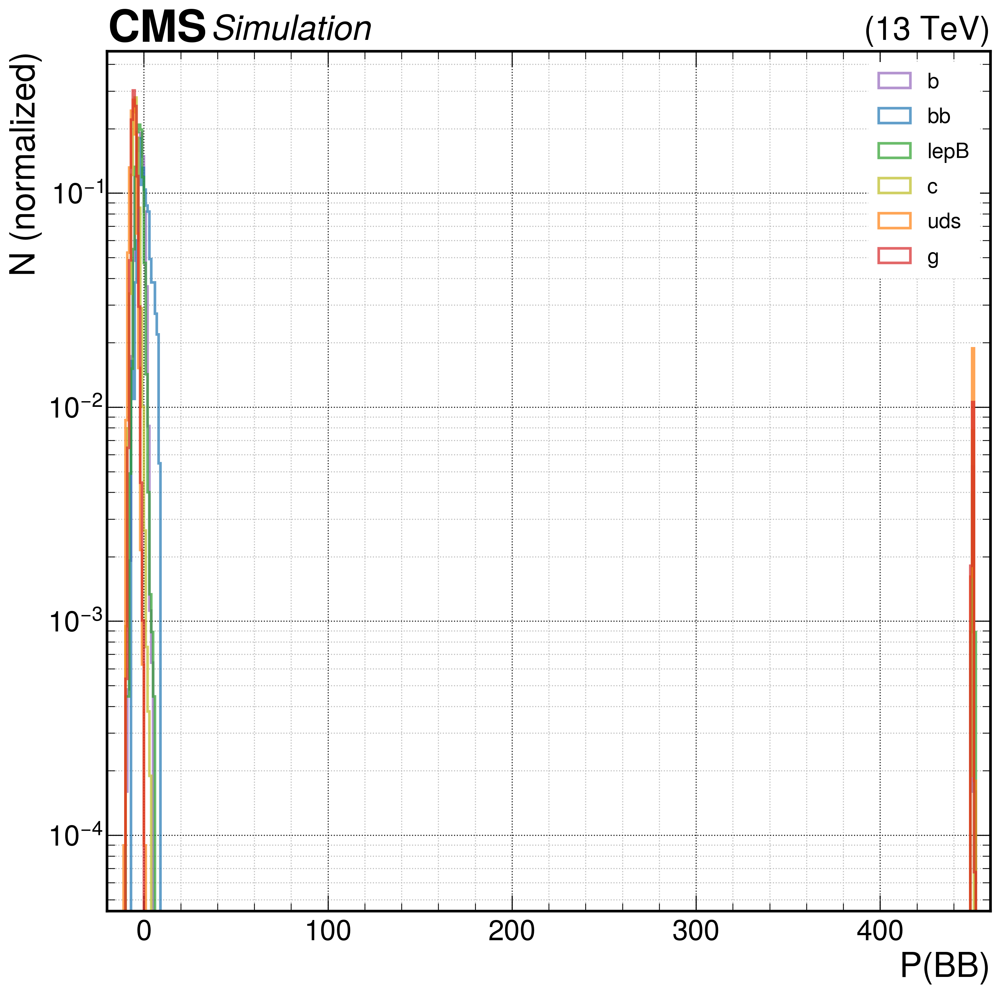

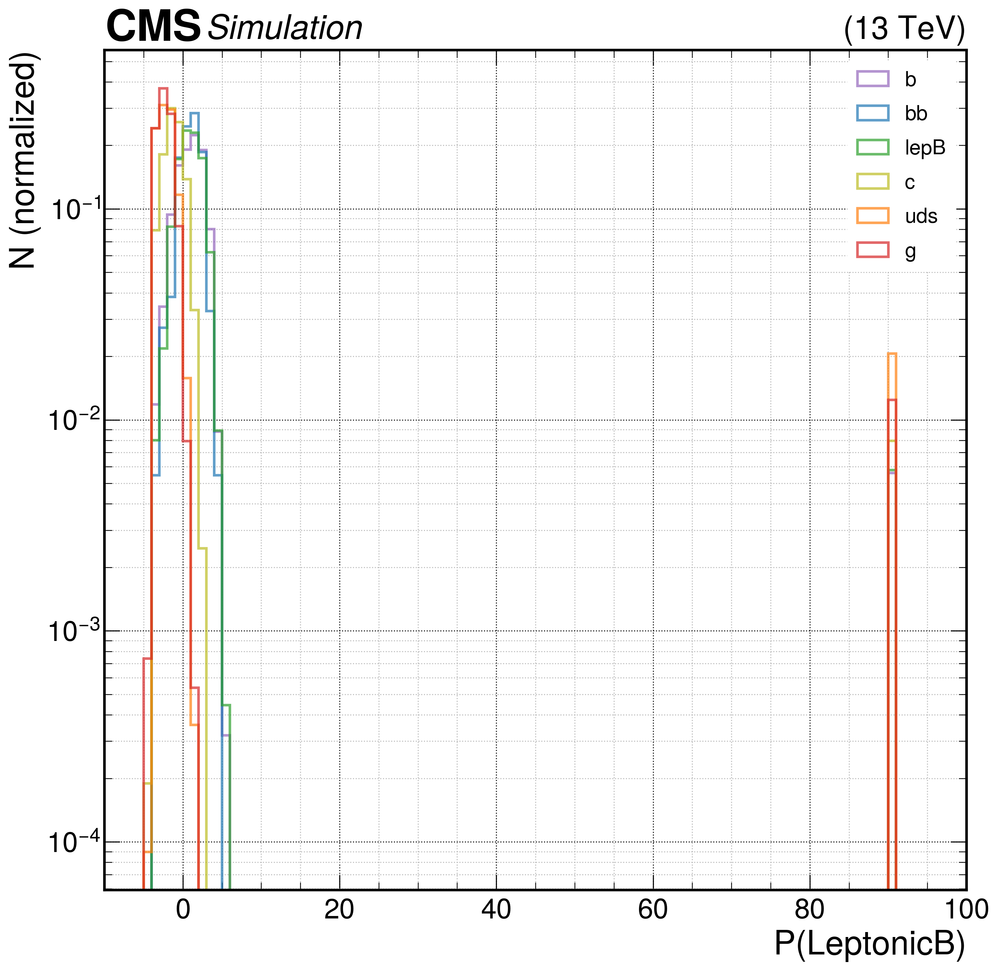

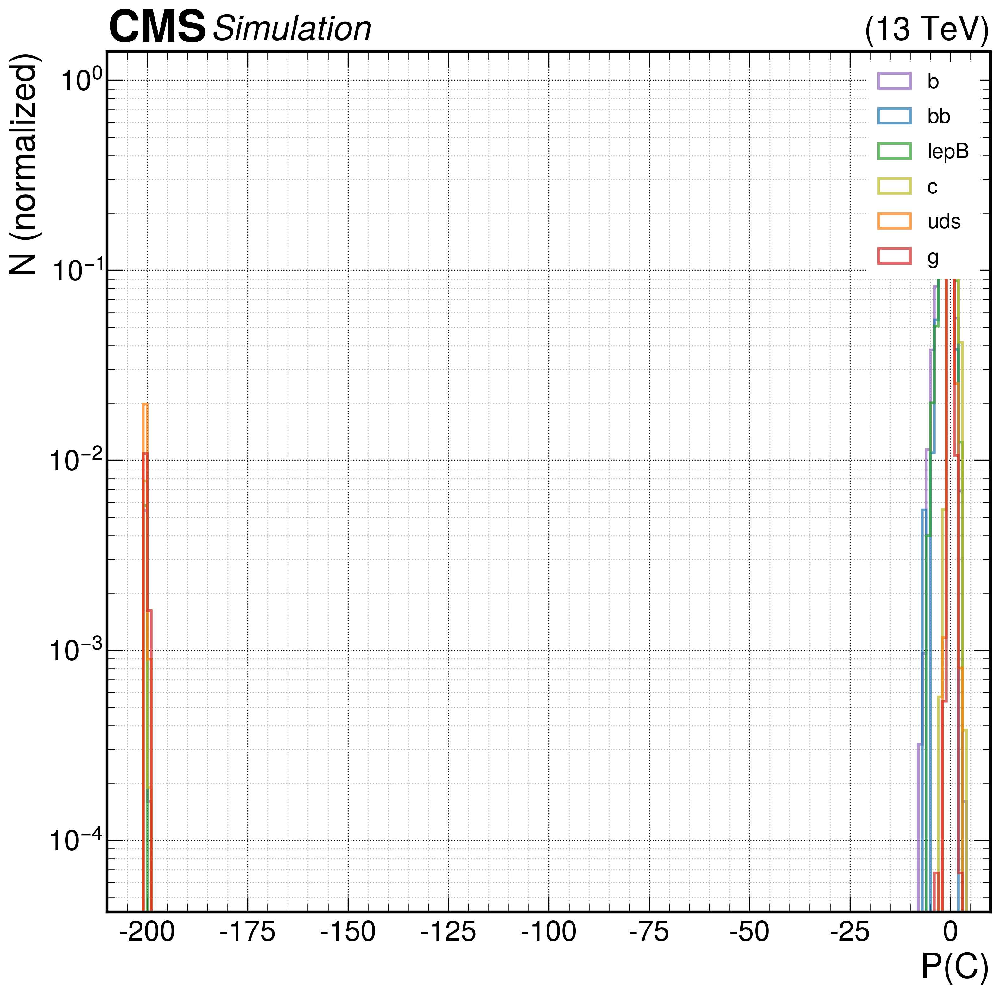

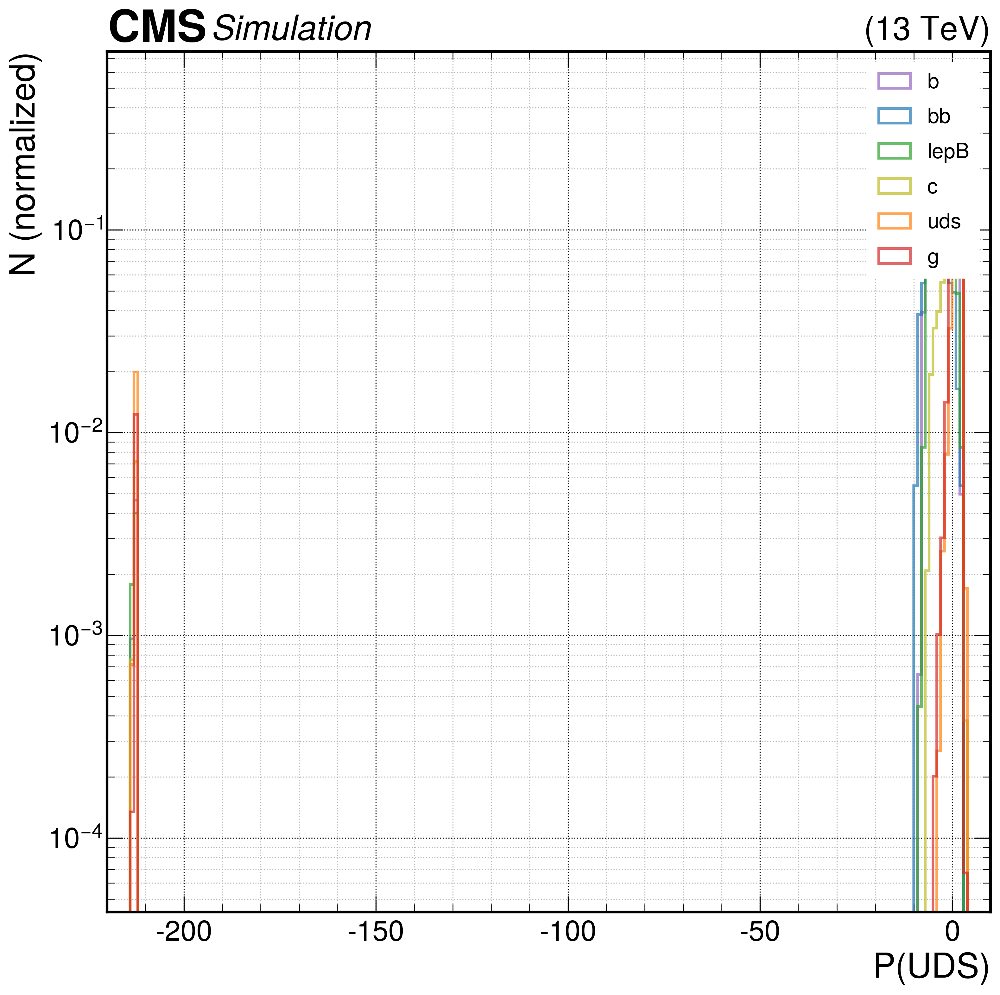

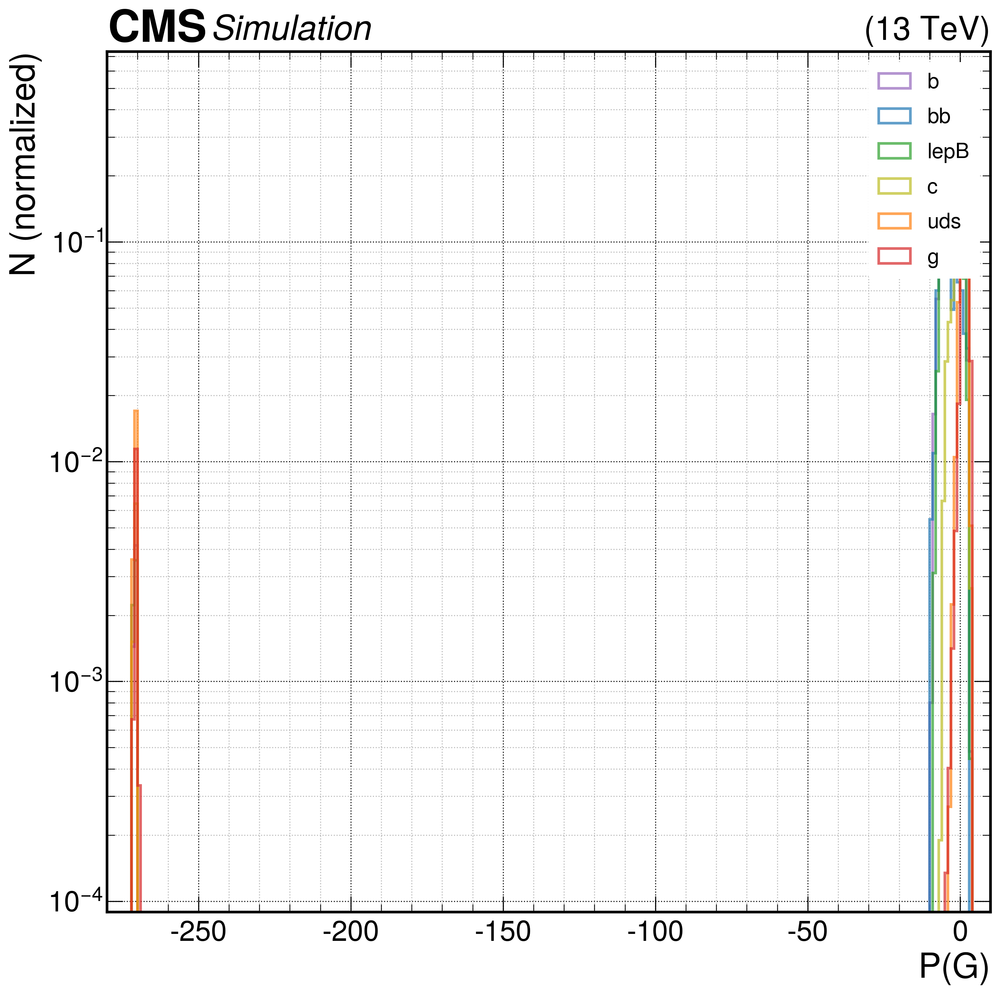

In [41]:
# plot model outputs without softmax function applied
# 1 output, 6 flavours
output_names = quantities = ['prob_isB', 'prob_isBB', 'prob_isLeptonicB', 'prob_isC', 'prob_isUDS', 'prob_isG']
ranges=[[-20, 20], [-20, 20], [-20, 20], [-20, 20], [-20, 20], [-20, 20]]

for i in range(len(output_names)):
    ranges[i][0]=round(np.min(output[:,i])/10)*10-10
    ranges[i][1]=round(np.max(output[:,i])/10)*10+10
    print(ranges[i])
    fig,ax = plt.subplots(figsize=[12,12], dpi=300)
    ax.set_xlim(left=ranges[i][0], right=ranges[i][1])
    ax.set_yscale('log')
    ax.set_ylabel('N (normalized)')
    ax.set_xlabel(output_labels[i])
    ax.grid(which='minor', alpha=0.85)
    ax.grid(which='major', alpha=0.95, color='black')
    for j in range(len(flavour_names)):
        x = output[np.where(flavour==flavour_ids[j])[0],i]
        ax.hist(x, bins=1000, range=(-500,500), weights=np.ones(len(x))/flavour_N[j], histtype='step', linewidth=2,
        alpha=0.7, color=flavour_colors[j], label=flavour_names[j])
    legloc = 'upper right'
    leg=ax.legend(title='',fontsize=16,title_fontsize=20,labelspacing=0.7,loc=legloc,frameon=True,framealpha=1,facecolor='white')
    if 'right' in legloc:
        aligned = 'right'
    else:
        aligned = 'left'
    leg._legend_box.align = aligned
    leg.get_frame().set_linewidth(0.0)
    hep.cms.label(rlabel='(13 TeV)')
    print('saving')
    fig.savefig('output_plots/{}_{}.pdf'.format(model_name, output_names[i]))

In [44]:
len(np.where(softmax_output==1)[0])

505